<a href="https://colab.research.google.com/github/jen0525/AIFFEL_quest_cr/blob/master/Exploration/Ex6/EX06.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **🎆 Stable Diffusion과 ControlNet으로 이미지 생성하기 🌇**

## **이미지 생성**

## **윤곽선 검출**

In [ ]:
# Image-to-Image Generation 파이프라인 불러오기
from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

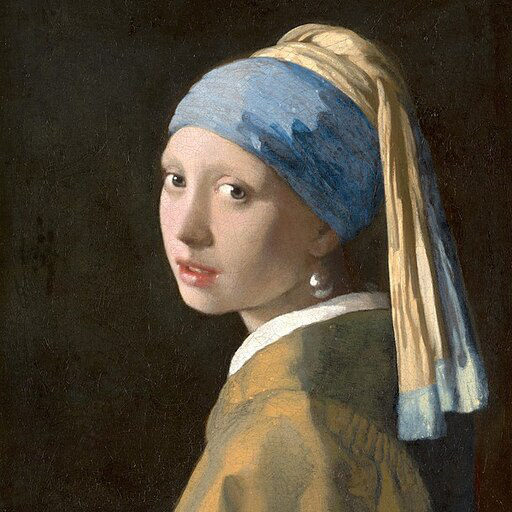

In [ ]:
import torch
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

# 이미지 불러오기
image = load_image(
    "https://hf.co/datasets/huggingface/documentation-images/resolve/main/diffusers/input_image_vermeer.png"
)

image

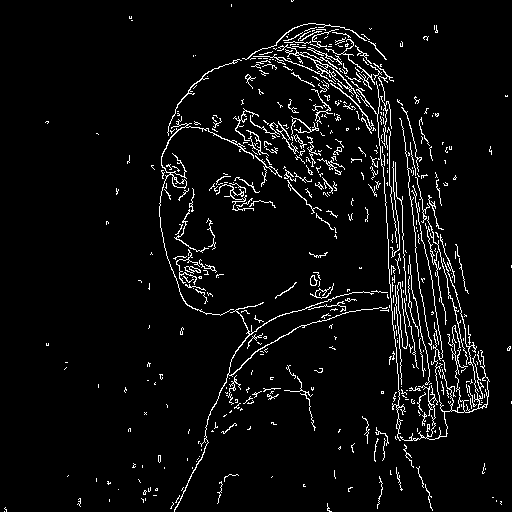

In [ ]:
import cv2
from PIL import Image
import numpy as np

# 이미지를 NumPy 배열로 변환합니다.
image = np.array(image)

# threshold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 윤곽선을 검출합니다.
image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)  # NumPy 배열을 PIL 이미지로 변환합니다.

canny_image

In [ ]:
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

device = "cpu"  # CUDA가 없을 경우 CPU 사용
torch_dtype = torch.float32  # CPU에서 사용 가능한 dtype

# ControlNet 모델 로드
canny_controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch_dtype
)

# Stable Diffusion + ControlNet 파이프라인 로드
canny_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=canny_controlnet,
    torch_dtype=torch_dtype
)

# 디바이스로 이동
canny_pipe = canny_pipe.to(device)

In [ ]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cpu")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(0)

# 이미지를 생성합니다.
canny_image = canny_pipe(
    prompt="in Picasso cubism style, abstract geometric face, split colors, surreal background",
    num_inference_steps=20,
    generator=generator,
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다.
canny_image.save("/content/drive/MyDrive/diffusers/image.png")

# 생성된 이미지를 출력합니다.
canny_image

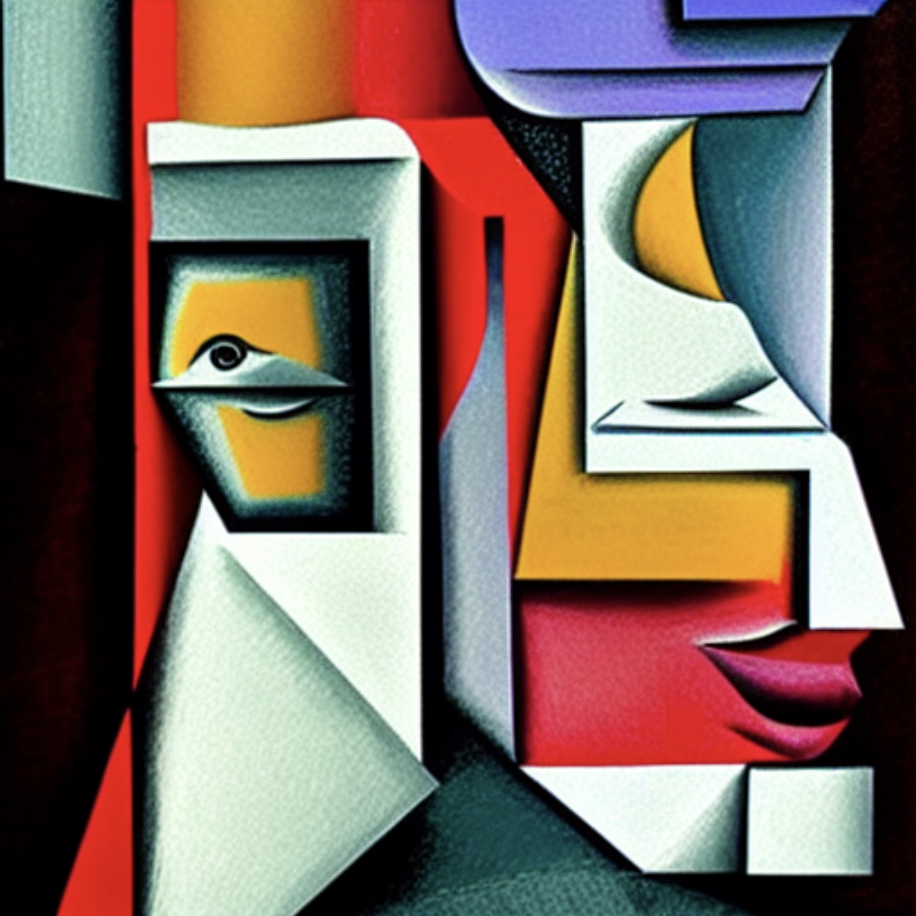

In [ ]:
from diffusers import UniPCMultistepScheduler
import torch

# 스케줄러 설정
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cpu")  # CPU 사용

# 시드 고정 (일관된 결과)
generator = torch.manual_seed(0)

# 이미지 생성 (하이퍼파라미터 조절)
canny_image = canny_pipe(
    prompt="in Ghibli style, dreamy colors, soft background, watercolor texture, fantasy setting",
    negative_prompt="blurry, photorealistic, extra limbs, noisy background",
    num_inference_steps=40,
    guidance_scale=9.5,
    generator=generator,
    image=canny_image,
    height=512,
    width=512
).images[0]

# 저장 및 출력
canny_image.save("/content/drive/MyDrive/diffusers/image.png")
canny_image

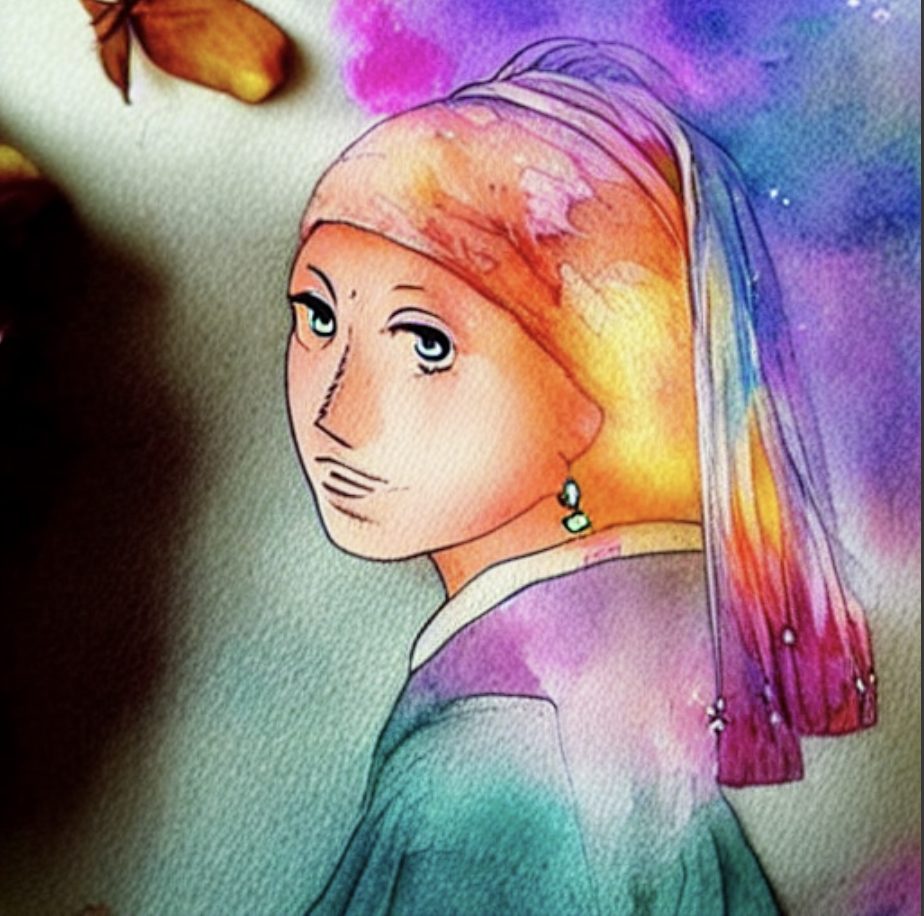

## **인체 자세 감지**

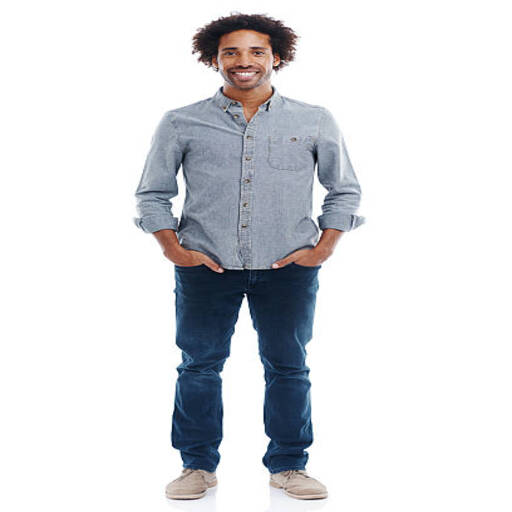

In [ ]:
# controlnet-aux를 설치합니다. Human pose를 검출해주는 controlnet의 보조용 모델입니다.
!pip install controlnet-aux==0.0.1
from diffusers.utils import load_image

openpose_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/person.png"
)
openpose_image

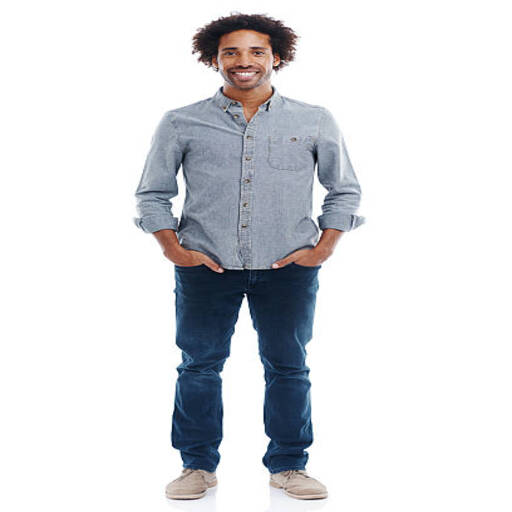

In [ ]:
openpose_image

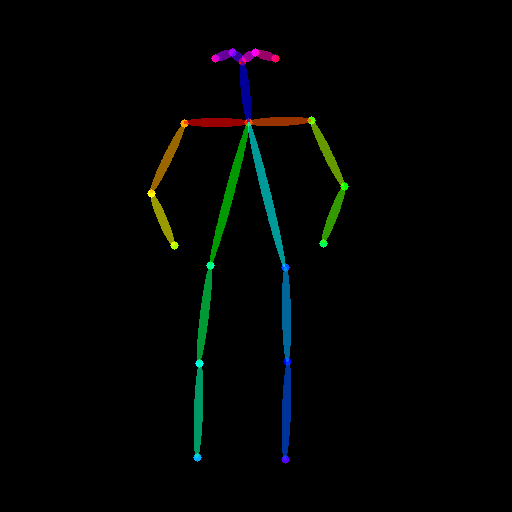

In [ ]:
from controlnet_aux import OpenposeDetector

# 인체의 자세를 검출하는 사전 학습된 ControlNet 불러오기
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 이미지에서 자세 검출
openpose_image = openpose(openpose_image)
openpose_image

In [ ]:
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

# CPU 사용 설정
torch_dtype = torch.float32
device = "cpu"

# ControlNet (OpenPose) 모델 로드
openpose_controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-openpose",
    torch_dtype=torch_dtype
)

# Stable Diffusion + ControlNet 파이프라인 로드
openpose_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=openpose_controlnet,
    torch_dtype=torch_dtype
)

# CPU 디바이스로 이동
openpose_pipe = openpose_pipe.to(device)

In [ ]:
from diffusers import UniPCMultistepScheduler
import torch

# 스케줄러 설정 (openpose_pipe에 적용)
openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cpu")

# 시드 고정
generator = torch.manual_seed(0)

#  프롬프트
prompt = "a confident woman standing in a futuristic city, full body, cinematic lighting, detailed outfit"

# 이미지 생성
result = openpose_pipe(
    prompt=prompt,
    image=openpose_image,  # 포즈 기반 이미지
    num_inference_steps=40,
    guidance_scale=7.5,
    controlnet_conditioning_scale=1.0,
    generator=generator
).images[0]

# 저장 및 출력
result.save("/content/drive/MyDrive/diffusers/openpose_result.png")
result

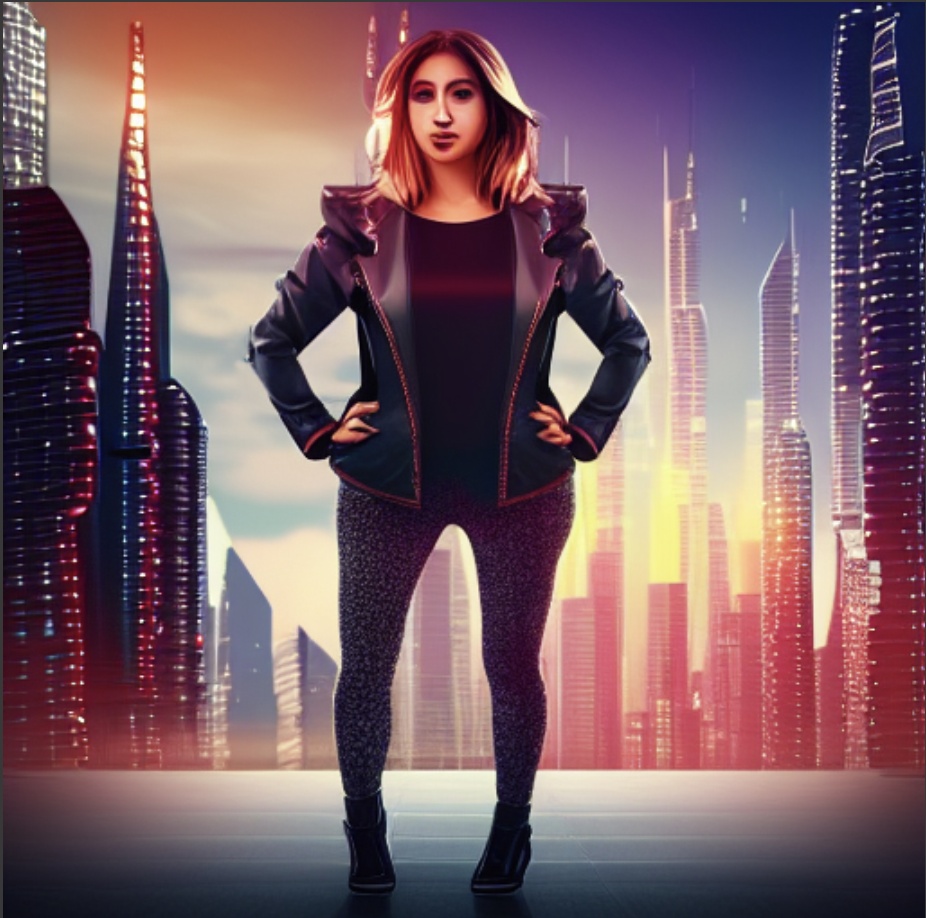

## **윤곽선 검출 + 인체 자세 감지**

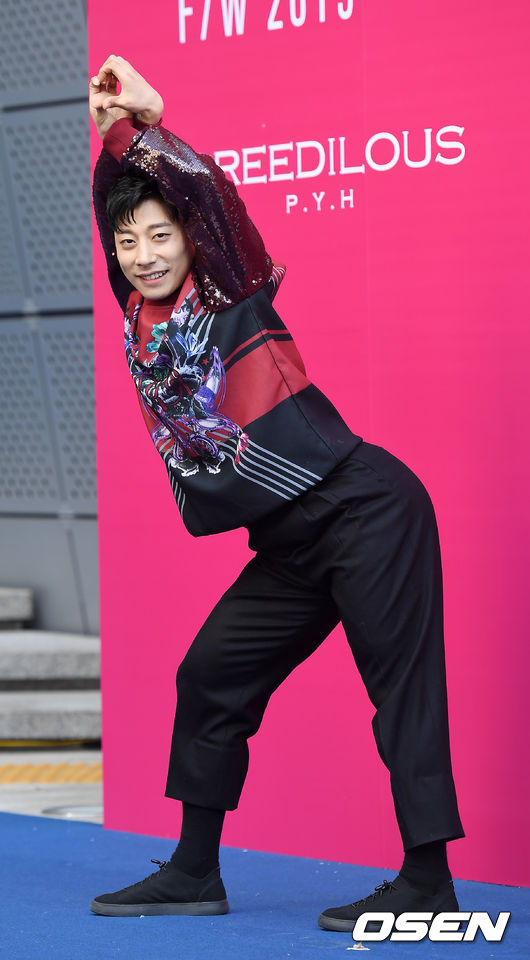

In [ ]:
from diffusers.utils import load_image
from PIL import Image
import cv2
import numpy as np

# 이미지를 불러옵니다 (
canny_image = load_image("/content/drive/MyDrive/pose.jpg")
canny_image = canny_image.convert("RGB")  # RGB로 변환 (OpenCV는 BGR로 읽기 때문)

# Canny edge detection의 threshold 설정
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환하고 Grayscale로 바꿈
canny_image_np = np.array(canny_image)
canny_gray = cv2.cvtColor(canny_image_np, cv2.COLOR_RGB2GRAY)

# 중앙 부분 마스킹 (중앙 1/2 영역)
zero_start = canny_gray.shape[1] // 4
zero_end = zero_start + canny_gray.shape[1] // 2
canny_gray[:, zero_start:zero_end] = 0

# Canny Edge Detection 수행
edges = cv2.Canny(canny_gray, low_threshold, high_threshold)

# numpy 배열 → RGB → PIL 이미지로 변환
edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
canny_image_final = Image.fromarray(edges_rgb)

canny_image

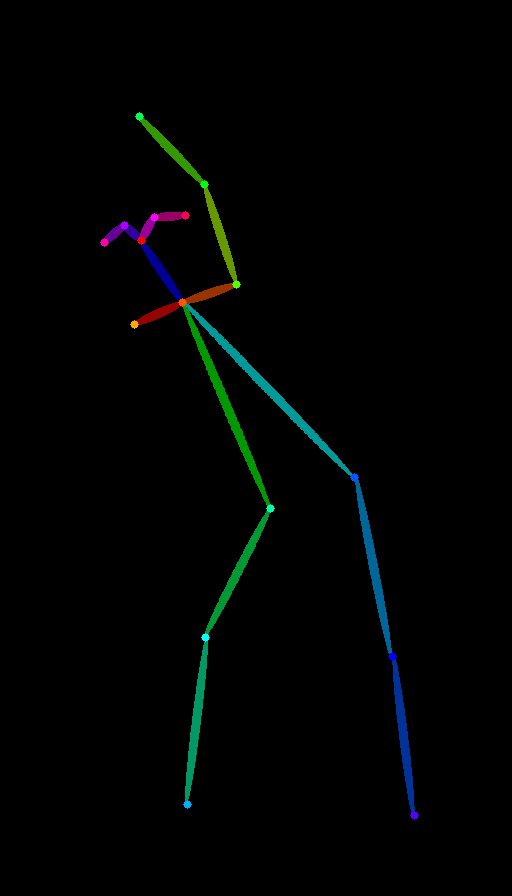

In [ ]:
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image

# 이미지를 불러옵니다
openpose_image_input = load_image("/content/drive/MyDrive/pose.jpg")

# OpenPose 전처리기 모델 로드
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# OpenPose를 사용하여 인체 자세 검출
openpose_result = openpose(openpose_image_input)

openpose_result

In [ ]:
from PIL import Image

# 원하는 해상도 (예: 512x512)
target_size = (512, 512)

# 리사이즈된 이미지
canny_image_final_resized = canny_image_final.resize(target_size)
openpose_result_resized = openpose_result.resize(target_size)

# 이미지 리스트 업데이트
images = [canny_image_final_resized, openpose_result_resized]

In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import torch

# 1. ControlNet 두 개를 리스트로 만듭니다 (Canny + OpenPose)
controlnets = [
    ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float32),
    ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float32)
]

# 2. 멀티 ControlNet 파이프라인 생성
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnets,
    torch_dtype=torch.float32
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cpu")

# 3. 프롬프트
prompt = "a futuristic American male dancer with Western outfit"
negative_prompt = "blurry, distorted, low quality, extra limbs"

# 4. Seed 고정
generator = torch.manual_seed(42)

# 5. ControlNet 입력 이미지 리스트 (⭐️ 순서 중요: Canny 먼저, OpenPose 나중)
images = [canny_image_final_resized, openpose_result_resized]

# 6. 이미지 생성
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=40,
    guidance_scale=7.5,
    image=images,
    controlnet_conditioning_scale=[1.0, 1.0],
    generator=generator
).images[0]

# 7. 저장 및 출력
image.save("/content/drive/MyDrive/diffusers/multi_controlnet_output.png")
image

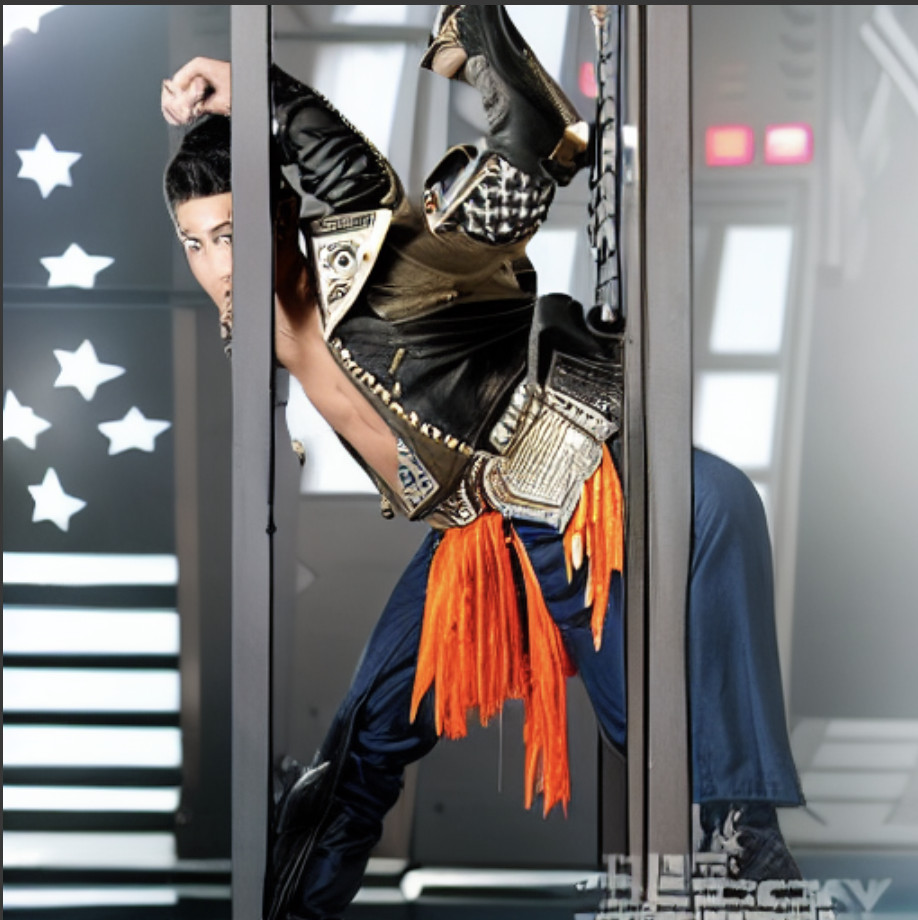

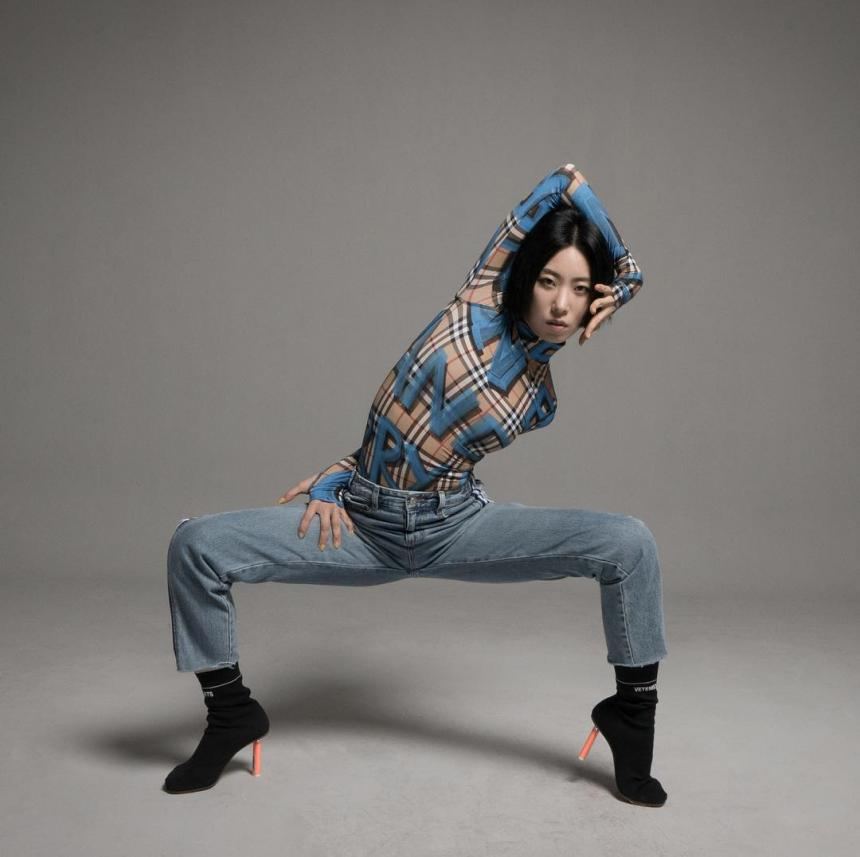

In [ ]:
from diffusers.utils import load_image
from PIL import Image
import cv2
import numpy as np

# 이미지를 불러옵니다 (
canny_image = load_image("/content/drive/MyDrive/pose2.jpg")
canny_image = canny_image.convert("RGB")  # RGB로 변환 (OpenCV는 BGR로 읽기 때문)

# Canny edge detection의 threshold 설정
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환하고 Grayscale로 바꿈
canny_image_np = np.array(canny_image)
canny_gray = cv2.cvtColor(canny_image_np, cv2.COLOR_RGB2GRAY)

# 중앙 부분 마스킹 (중앙 1/2 영역)
zero_start = canny_gray.shape[1] // 4
zero_end = zero_start + canny_gray.shape[1] // 2
canny_gray[:, zero_start:zero_end] = 0

# Canny Edge Detection 수행
edges = cv2.Canny(canny_gray, low_threshold, high_threshold)

# numpy 배열 → RGB → PIL 이미지로 변환
edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
canny_image_final = Image.fromarray(edges_rgb)

canny_image

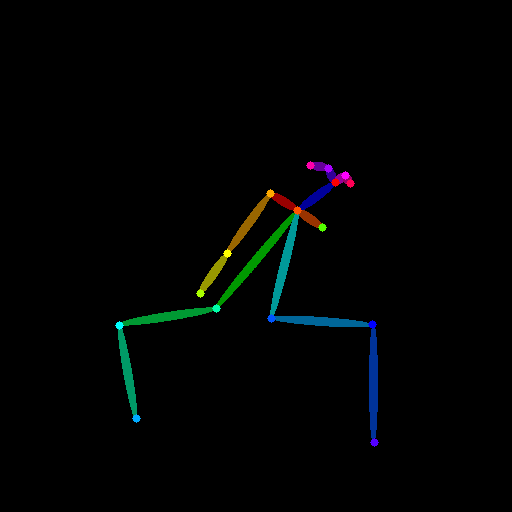

In [ ]:
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image

# 이미지를 불러옵니다
openpose_image_input = load_image("/content/drive/MyDrive/pose2.jpg")

# OpenPose 전처리기 모델 로드
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# OpenPose를 사용하여 인체 자세 검출
openpose_result = openpose(openpose_image_input)

openpose_result

In [ ]:
from PIL import Image

# 원하는 해상도 (예: 512x512)
target_size = (512, 512)

# 리사이즈된 이미지
canny_image_final_resized = canny_image_final.resize(target_size)
openpose_result_resized = openpose_result.resize(target_size)

# 이미지 리스트 업데이트
images = [canny_image_final_resized, openpose_result_resized]

In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import torch

# 1. ControlNet 두 개를 리스트로 만듭니다 (Canny + OpenPose)
controlnets = [
    ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float32),
    ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float32)
]

# 2. 멀티 ControlNet 파이프라인 생성
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnets,
    torch_dtype=torch.float32
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cpu")

# 3. 프롬프트
prompt = "a cute character with a pretty dress"
negative_prompt = "blurry, distorted, low quality, extra limbs"

# 4. Seed 고정
generator = torch.manual_seed(42)

# 5. ControlNet 입력 이미지 리스트 (⭐️ 순서 중요: Canny 먼저, OpenPose 나중)
images = [canny_image_final_resized, openpose_result_resized]

# 6. 이미지 생성
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=40,
    guidance_scale=7.5,
    image=images,
    controlnet_conditioning_scale=[1.0, 1.0],
    generator=generator
).images[0]

# 7. 저장 및 출력
image.save("/content/drive/MyDrive/diffusers/multi_controlnet_output.png")
image

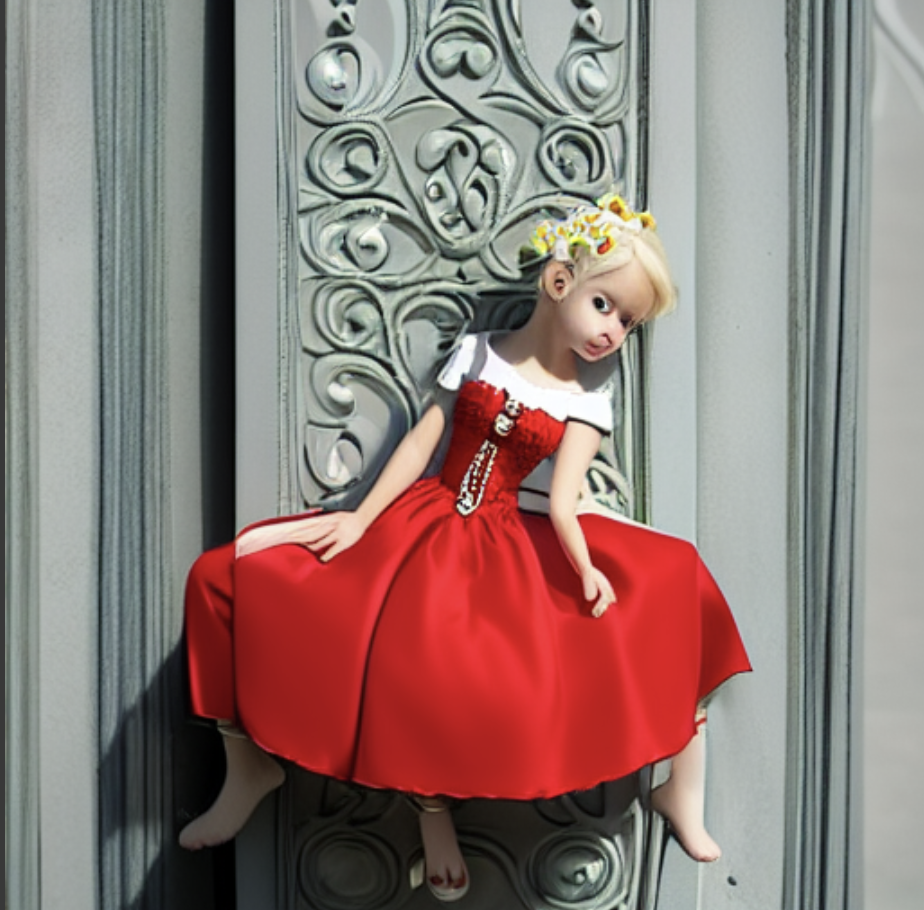

허재은 회고: GPT가 얼마나 능력있는지 알게 되었다,,,지난번 Transformer에 이어 이미지 생성을 다른 모델로 시도 해봤는데 Output이 나오고 보니 gpt는 정말 이미지 생성도 텍스트 생성도 너무 잘하는게 같다. 이게 바로 군비경쟁(데이터양)의 힘인가..? 그래도 직접 여러가지 프롬프트를 변경하면서 해보니 재미있었다.